- https://umap-learn.readthedocs.io/en/latest/basic_usage.html

- https://umap-learn.readthedocs.io/en/latest/parameters.html

In [1]:
import numpy as np
import pandas as pd
import os

from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

import matplotlib.pyplot as plt

import seaborn as sns
import umap
from umap import UMAP

from time import time
import harmonypy as hm

from itertools import product

%matplotlib inline

os.chdir('./output/UMAP')

# read the data

In [2]:
# read data
df_all = pd.read_parquet("../level5_AllPlates_mad_robustize_DMSO.parquet")

# filter out conditions of interest

In [3]:
df = df_all.copy()

#------------- plates ----------------#
selected_plates = ["P103573","P103587","P103588"]
df = df[~df['Metadata_plate_map_name'].isin(selected_plates)]

# ----------- compounds ---------------#
selected_compounds = ["DMSO", "uninfected","DD4386006","DO8167002","DI1202001"]
df = df[df['Metadata_cmpdName'].isin(selected_compounds)]

#------------- doses ----------------#
#selected_doses = [0.3,10.0]
#df = df[df['Metadata_cmpdConc'].isin(selected_doses)]

# remove AB features !!!
df = df.filter(regex='^(?!.*ER)') #remove AB features
#df   = df.filter(regex='(ER|^Metadata)') # only AB features!

count = df["Metadata_cmpdName"].unique().tolist()
len(count)

5

In [4]:
df["Metadata_cmpdNameConc"] = df["Metadata_cmpdName"] + "_" + df["Metadata_cmpdConc"].astype(str)

# set color map

In [5]:
# what do you want to be coloured?
df.columns[df.columns.str.contains("Metadata_")].to_list()

['Metadata_plate_map_name',
 'Metadata_cmpdName',
 'Metadata_cmpdConc',
 'Metadata_Well',
 'Metadata_Site',
 'Metadata_Object_Count',
 'Metadata_cmpdNameConc']

In [6]:
colour_meta = 'Metadata_cmpdName'

In [7]:
uniques = pd.factorize(df[colour_meta], sort=True)
n_cat   = df[colour_meta].nunique()
cat     = list(uniques)
color   = 'Set2'
colors  = sns.color_palette(color, n_cat+1)[::-1]
colors.pop(0)

condition = df[colour_meta].unique()
condition.sort()

res = {condition[i]: colors[i] for i in range(len(condition))}

In [8]:
c = [x for x in df.Metadata_cmpdName.map(res)]

# calculate UMAP

In [13]:
def run_umap(df, use_pca=True, n_neighbors_list=[5, 15, 50], min_dist_list=[0.1, 0.5, 1.0], n_components_pca=50):

    df = df.dropna()
    df_data = df.loc[:, ~df.columns.str.contains('Meta')].values
    scaler = StandardScaler()
    scaled_df_data = scaler.fit_transform(df_data)
    
    if use_pca:
        pca = PCA(n_components=n_components_pca)
        pca_df_data = pca.fit_transform(scaled_df_data)
        data_sub = pca_df_data
        title_prefix = "with PCA"
    else:
        data_sub = scaled_df_data
        title_prefix = "without PCA"
    
    total_plots = len(n_neighbors_list) * len(min_dist_list)
    nrows = len(n_neighbors_list)
    ncols = len(min_dist_list)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 15))
    axes = axes.flatten()

    unique_compounds = df['Metadata_cmpdName'].unique()
    palette = sns.color_palette("husl", len(unique_compounds))

    compound_palette = {compound: palette[i] for i, compound in enumerate(unique_compounds)}

    for idx, (n_neighbors, min_dist) in enumerate(product(n_neighbors_list, min_dist_list)):
        reducer = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, random_state=43)
        embedding = reducer.fit_transform(data_sub)
        
        sns.set(style='white')
        sns.scatterplot(
            x=embedding[:, 0],
            y=embedding[:, 1],
            hue=df['Metadata_cmpdName'],
            palette=compound_palette,
            alpha=0.4,
            legend=True,
            ax=axes[idx]
        )
        
        axes[idx].set_title(f'UMAP (n_neighbors={n_neighbors}, min_dist={min_dist}) {title_prefix}')
        axes[idx].set(xticks=[], yticks=[])

    plt.tight_layout()
    plt.show()

    filename = f'UMAP_{title_prefix.replace(" ", "_")}.png'
    fig.savefig(filename, dpi=600, bbox_inches='tight')


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridd

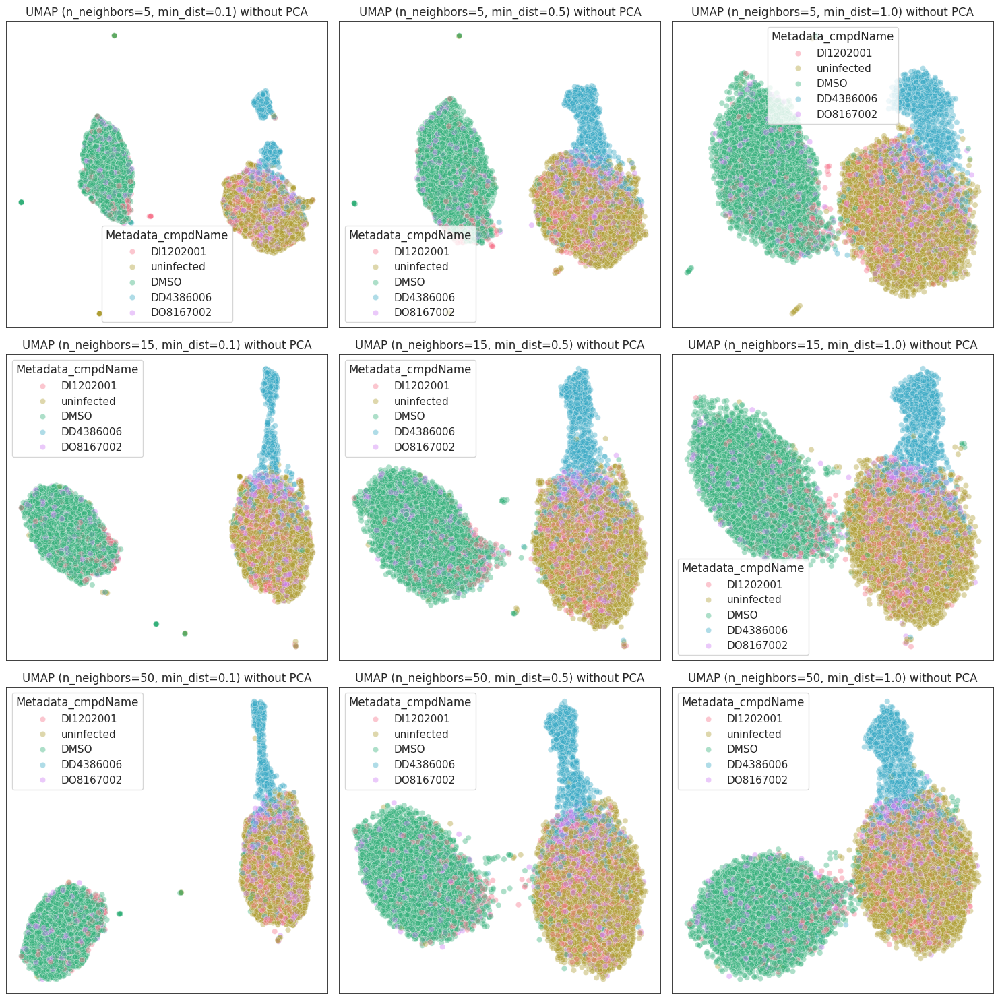

In [14]:
run_umap(df, use_pca=False)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridd

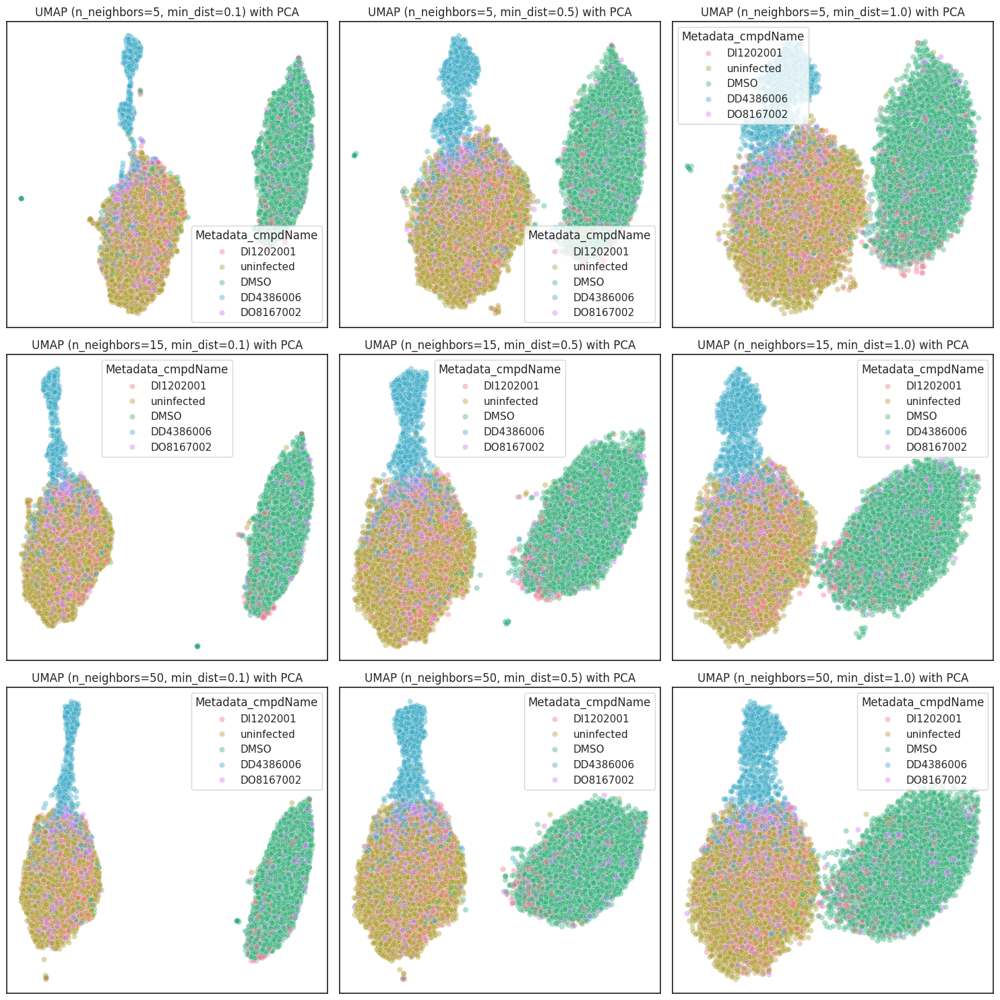

In [15]:
run_umap(df, use_pca=True)

# interactive

In [16]:
import plotly.express as px
import plotly.io as pio

df = df.dropna()
df_data = df.loc[:, ~df.columns.str.contains('Meta')].values
scaler = StandardScaler()
scaled_df_data = scaler.fit_transform(df_data)

reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.5, random_state=43)
embedding = reducer.fit_transform(scaled_df_data)

n_colors = len(df['Metadata_cmpdName'].unique())
colors = px.colors.sample_colorscale("rainbow", [n / (n_colors - 1) for n in range(n_colors)])

fig = px.scatter(
data_frame=df,
x=embedding[:, 0],
y=embedding[:, 1],
color='Metadata_cmpdName',
#symbol='markers',
opacity=0.4,
    hover_data={
        'Metadata_cmpdName': True,
        'Metadata_Well': True,
        'Metadata_Site': True,
        'Metadata_plate_map_name': True
    },
labels={'Metadata_plate_map_name': 'Compound'},
title='UMAP 5uM compounds 48h',
color_discrete_sequence=colors
)

fig.update_layout(
    autosize=False,
    width=900,  
    height=900,  
    plot_bgcolor='white' 
)

fig.update_traces(marker=dict(size=8))

fig.show()

pio.write_html(fig, 'umap_plot_interactive.html')

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


# cleaned data on well level

In [17]:
df_all    = pd.read_parquet("../level7_modz_consensus_df_perwell.parquet")

df = df_all.copy()

#------------- plates ----------------#
selected_plates = ["P103573","P103587","P103588"]
df = df[~df['Metadata_plate_map_name'].isin(selected_plates)]

# ----------- compounds ---------------#
selected_compounds = ["DMSO", "uninfected","DD4386006","DO8167002","DI1202001","[fenb]","[etop]"]
df = df[df['Metadata_cmpdName'].isin(selected_compounds)]

#------------- doses ----------------#
selected_doses = [0.3,10.0]
df = df[df['Metadata_cmpdConc'].isin(selected_doses)]

# remove AB features !!!
df = df.filter(regex='^(?!.*ER)') #remove AB features
df

,Metadata_plate_map_name,Metadata_cmpdName,Metadata_cmpdConc,Metadata_cmpdAndDose,Metadata_Well,Nuclei_AreaShape_Eccentricity,Nuclei_AreaShape_Extent,Nuclei_AreaShape_MajorAxisLength,Nuclei_AreaShape_MaxFeretDiameter,Nuclei_AreaShape_MinFeretDiameter,...,Cells_RadialDistribution_ZernikePhase_RNA_8_0,Cells_RadialDistribution_ZernikePhase_RNA_8_2,Cells_RadialDistribution_ZernikePhase_RNA_8_4,Cells_RadialDistribution_ZernikePhase_RNA_8_6,Cells_RadialDistribution_ZernikePhase_RNA_8_8,Cells_RadialDistribution_ZernikePhase_RNA_9_1,Cells_RadialDistribution_ZernikePhase_RNA_9_3,Cells_RadialDistribution_ZernikePhase_RNA_9_5,Cells_RadialDistribution_ZernikePhase_RNA_9_7,Cells_RadialDistribution_ZernikePhase_RNA_9_9
288,P103555,DD4386006,0.3,DD4386006_0.3,G01,-0.681587,1.287419,2.140383,2.269107,2.684067,...,0.704975,-0.321546,0.071195,0.430293,-0.096450,0.383388,0.200811,0.017333,0.305662,-0.144521
289,P103555,DD4386006,0.3,DD4386006_0.3,K05,-0.094515,0.917142,1.500497,1.539897,1.627995,...,1.471872,0.718134,0.465510,-0.415308,0.561812,-0.330084,-0.000420,-0.069271,0.255580,0.342767
292,P103555,DD4386006,10.0,DD4386006_10.0,E13,-0.480508,0.942348,4.046019,4.248707,4.310287,...,1.955894,-0.232563,-0.179604,-0.174519,-0.043658,0.033201,0.005460,-0.411261,0.049103,-0.572720
293,P103555,DD4386006,10.0,DD4386006_10.0,G15,-0.376901,0.148659,3.878235,4.096259,4.036762,...,1.525587,-0.320442,-0.113166,0.569073,0.110509,0.566294,-0.727315,-0.159004,0.220965,-0.214041
296,P103555,DI1202001,0.3,DI1202001_0.3,A09,-0.255376,0.864966,1.269777,1.327660,1.469383,...,0.272106,-0.041734,-0.281625,-0.343191,0.279142,-0.119569,0.370389,-0.350660,0.054729,0.258259
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6822,P103572,uninfected,0.3,uninfected_0.3,N16,-0.994357,1.260487,0.716335,0.719511,1.633772,...,-0.357769,0.180900,0.106789,-0.180032,-0.366268,0.481790,0.120514,-0.129921,-0.100577,-0.027397
6823,P103572,uninfected,0.3,uninfected_0.3,O08,-1.421032,1.175672,0.674680,0.700812,1.882880,...,0.104896,0.188209,0.311097,0.217447,0.157854,0.260826,0.115425,0.415784,-0.883760,-0.458050
6824,P103572,uninfected,0.3,uninfected_0.3,O16,-1.192651,1.249726,0.381803,0.397858,1.487554,...,-0.052574,-0.288646,-0.039215,0.204964,-0.137535,0.252233,-0.228724,0.273382,0.008970,0.477979
6825,P103572,uninfected,0.3,uninfected_0.3,P08,-1.336448,1.201680,0.949319,1.023840,2.014629,...,0.059582,0.293751,0.209939,0.212224,-0.136855,-0.067665,-0.397528,-0.014869,-0.209354,0.043438


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/

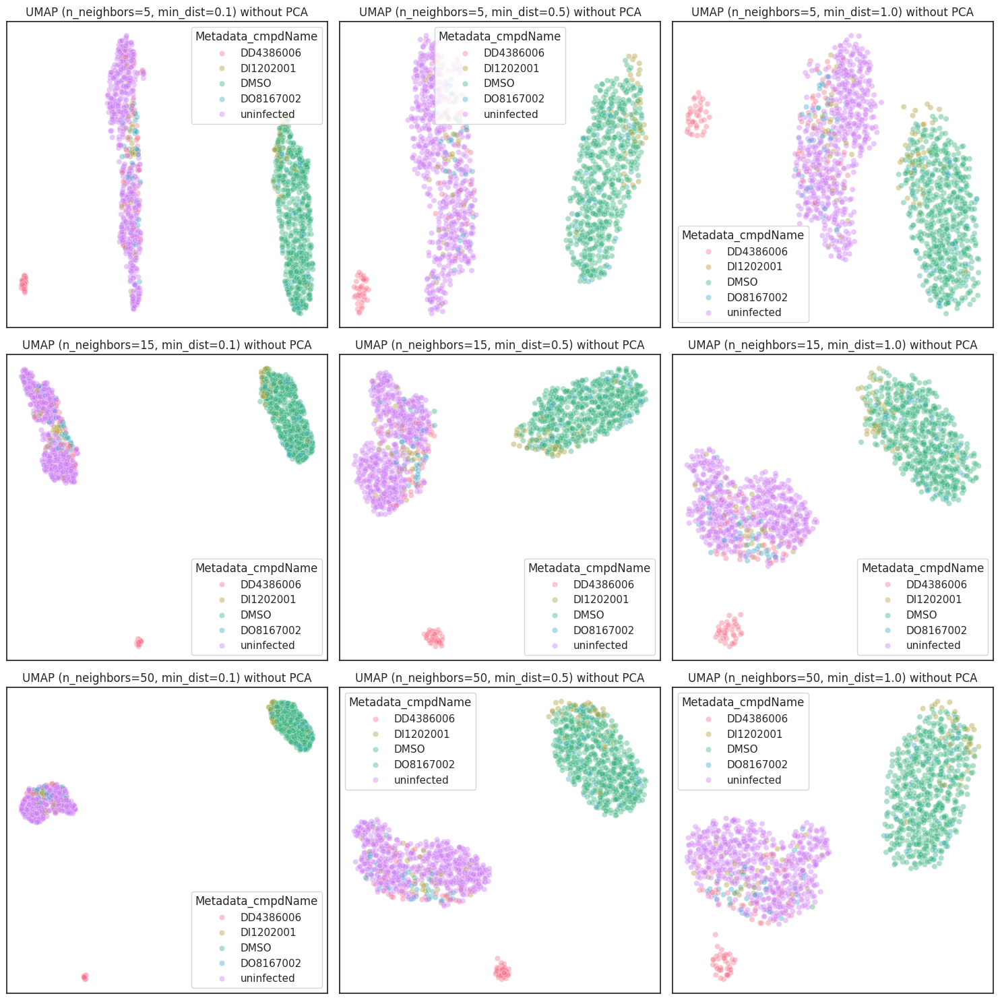

In [18]:
run_umap(df, use_pca=False)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

/usr/local/lib/python3.10/dist-packages/

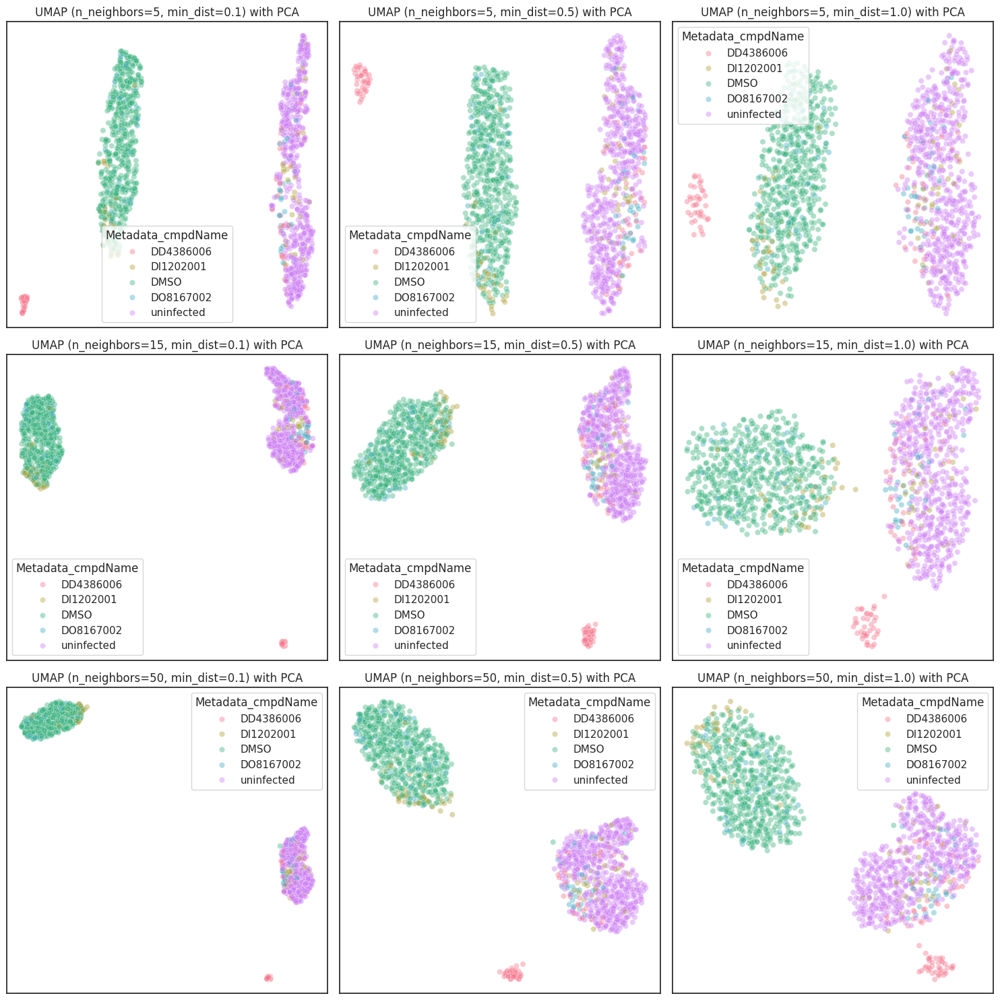

In [19]:
run_umap(df, use_pca=True)

_end